# Data processing in TIMSImaging
### Introduction
In this case study, we explore a MALDI-TIMS-TOF dataset of mouse kidney tissue, reproduce ion images in the manuscript, show the separation of ion mobility, and export the results in the open imzML format. The dataset is from Melaine Föll Lab and available at MassIVE.  
Li, M., Meyer, L., Meier, N., Witte, J., Maldacker, M., Seredynska, A., Schueler, J., Schilling, O. and Föll, M. (2025), Spatial Proteomics by Parallel Accumulation-Serial Fragmentation Supported MALDI MS/MS Imaging: A First Glance Into Multiplexed and Spatial Peptide Identification. Rapid Commun Mass Spectrom, 39: e10006. https://doi.org/10.1002/rcm.10006

In [1]:
import timsimaging

# enable visualization in the Jupyter notebook
from bokeh.io import show, output_notebook
output_notebook()
# disable FutureWarning
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

Loading BokehJS ...

### Load MALDI-TIMS-TOF raw data
Suppose we know nothing about this dataset. First we load the dataset and print basic information like pixel number and data range.

In [2]:
bruker_d_folder_name = "/work/VitekLab/Data/MS/Melanie_manuscript/Kidney_MS1_ITO6.d/"
dataset = timsimaging.spectrum.MSIDataset(bruker_d_folder_name)
dataset

100%|████████████████████████████████████| 38267/38267 [02:09<00:00, 294.61it/s]


MSIDataset with 38267 pixels
        mz range: 799.998-2500.007
        mobility range: 1.200-2.600
        

### View summary image and tables

Then we can view the TIC image, and hover on individual pixels to see the details:

In [3]:
dataset.image()

We can view the underlying data as tables, too

In [4]:
# pixel positions
dataset.pos

,XIndexPos,YIndexPos
Frame,,
1,336,175
2,337,175
3,338,175
4,339,175
5,340,175
...,...,...
38263,737,116
38264,738,116
38265,739,116


In [5]:
# metadata of pixels
dataset.data.frames

,Id,Time,ScanMode,MsMsType,TimsId,MaxIntensity,SummedIntensities,NumScans,NumPeaks,MzCalibration,T1,T2,TimsCalibration,PropertyGroup,AccumulationTime,RampTime,Pressure,Denoised
0,0,0.000000,20,0,64,0,0,1212,0,1,25.630815,23.592239,1,1,59.47,230.09,2.055982,0
1,1,2.671587,20,0,64,688,5346970,1212,76165,1,25.630815,23.592239,1,1,59.47,230.09,2.055982,0
2,2,2.941060,20,0,210641,637,4998845,1212,71095,1,25.630815,23.592239,1,1,59.47,230.09,2.055982,0
3,3,3.210677,20,0,407604,605,4793642,1212,67948,1,25.630815,23.592239,1,1,59.47,230.09,2.055982,0
4,4,3.480285,20,0,595229,626,4705085,1212,66534,1,25.630938,23.591317,1,1,59.47,230.09,2.055983,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38263,38263,10602.755832,20,0,11938087511,925,4587513,1212,64378,1,25.666533,23.497069,1,1,59.47,230.09,2.055988,0
38264,38264,10603.025466,20,0,11938264725,720,4511870,1212,63215,1,25.666508,23.496083,1,1,59.47,230.09,2.055988,0
38265,38265,10603.295060,20,0,11938440038,775,4700548,1212,66076,1,25.666508,23.496083,1,1,59.47,230.09,2.055988,0
38266,38266,10603.564667,20,0,11938622040,626,4648396,1212,65487,1,25.666508,23.496083,1,1,59.47,230.09,2.055988,0


### Set region of interest(ROI)
The left region is the kidney tissue, we can use the `set_ROI` method to set the ROI by `xmin`, `xmax`, `ymin`, `ymax` parameters.

In [6]:
dataset.set_ROI(name='kidney', xmax=500)

### Process on selected ROI
Then we run the processing pipline introduced in the basic use notebook.

In [7]:
meanspec = dataset.mean_spectrum(sampling_ratio=0.1, intensity_threshold=0.02, frame_indices=dataset.rois['kidney'])

In [8]:
peaklist, peak_extents, peak_apex = meanspec.peakPick(tolerance=3, return_extents=True, return_apex=True, adaptive_window=True)

Traversing graph...
Finding local maxima...
Summarizing...


In [10]:
results = dataset.process(sampling_ratio=0.1, intensity_threshold=0.02, tolerance=3, adaptive_window=True, roi='kidney', visualize=False)

Computing mean spectrum...
Traversing graph...
Finding local maxima...
Summarizing...


100%|███████████████████████████████████████| 3110/3110 [15:22<00:00,  3.37it/s]


We can view the peak list which enables scrolling and sorting

In [13]:
table, _ = timsimaging.plotting.feature_list(results["peak_list"])
show(table)

### Reproduce ion images in the manuscript
Here are reference values of selected precursor ions from the paper.

In [14]:
target = [
    (836.4425,1.3255),
    (1105.5731,1.5468),
    (1198.7003,1.6947),
    (1239.6418,1.7107),
    (1443.6943,1.7412)
]

Look up the corresponding features in the `peaklist`

In [15]:
from scipy.spatial import KDTree
tree = KDTree(peaklist[["mz_values", "mobility_values"]])
_, indices = tree.query(target)
features = peaklist.iloc[indices]
features

,mz_values,mobility_values,total_intensity
117,836.435111,1.327077,687.251197
1080,1105.527742,1.532713,1366.296474
1388,1198.704201,1.676394,507.526339
1531,1239.642706,1.704504,306.951676
2562,1443.693594,1.748626,611.962995


Plot ion images. We can accurately reproduce the ion images with high quality, plus interactivity.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
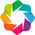

In [16]:
from timsimaging.plotting_new import DataHandler, heatmap, image
import holoviews as hv
hv.extension('bokeh')

In [27]:
ion_images = []
for i in features.index:
    df = dataset.pos.loc[dataset.rois["kidney"]].copy()
    df["intensity_values"] = results["intensity_array"][i]
    f = hv.HeatMap(df, kdims = ["XIndexPos", "YIndexPos"]).opts(cmap='viridis', colorbar=True, data_aspect=1, framewise=True, invert_yaxis=True)
    ion_images.append(f)
layout = hv.Layout(ion_images).cols(5)
layout

:Layout
   .HeatMap.I   :HeatMap   [XIndexPos,YIndexPos]   (intensity_values)
   .HeatMap.II  :HeatMap   [XIndexPos,YIndexPos]   (intensity_values)
   .HeatMap.III :HeatMap   [XIndexPos,YIndexPos]   (intensity_values)
   .HeatMap.IV  :HeatMap   [XIndexPos,YIndexPos]   (intensity_values)
   .HeatMap.V   :HeatMap   [XIndexPos,YIndexPos]   (intensity_values)

Below is the ion images of selected precursors in the mouse kidney dataset from the manuscript
![](mouse_kidney_ion_ref.jpg)

### Seperate ions by ion mobility
Ions with the same m/z(for example, isomers) could separated by ion mobility. As shown belw, TIMSImaging detected both peaks.

In [29]:
f = heatmap(meanspec)
peaks = hv.Points(peak_apex[["mz_values", "mobility_values"]]).opts(alpha=0.3, color='white')
f * peaks

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [x,y]   (z)
      .Points.I :Points   [mz_values,mobility_values]

### Export the processed data in imzML format
Finally, we export the processed data as continuous, centroid imzML file for downstream analysis in Cardinal.

In [30]:
timsimaging.spectrum.export_imzML(dataset, path="/scratch/zhu.yiny/case_study/mouse_kidney", peaks=results)

100%|████████████████████████████████████| 22978/22978 [02:13<00:00, 171.98it/s]
